20230426

In [1]:
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import statsmodels.api as sm
from scripts.MLdataset import *
import math
from itertools import combinations
import seaborn as sns
from scipy.stats import pearsonr

In [2]:
def OLS_fitter(expdf, paradf, para_name_list):
    '''
    use discriptor in x_title_list to fit expdata
    '''
    y = np.array(expdf)
    
    X = np.array(paradf[para_name_list])
    X = sm.add_constant(X)

    model = sm.OLS(y, X)
    results = model.fit()
    
    return model, results.rsquared


In [19]:
def OLS_tester(model, testexpdf, testparadf, para_name_list, plot=False):
    '''
    test model
    '''
    testparadf = testparadf[para_name_list]
    testparadf = sm.add_constant(testparadf)
    predresult = model.predict(testparadf)

    # get prediction and RMSE
    MSE = 0.0
    MAE = 0.0
    for i, true_value in enumerate(testexpdf):
        delta = true_value-predresult[i]
        MSE += delta ** 2
        MAE += abs(delta)
    MSE = MSE/len(testexpdf)
    MAE = MAE/len(testexpdf)
    RMSE = math.sqrt(MSE)
    print('test_RMSE=', RMSE)
    print('test_MAE=', MAE)

    # plot data
    if plot:
        print(testexpdf)
        print(predresult)
        # sns.scatterplot(x=testexpdf, y=predresult, marker='+', s=250)

    return RMSE, MAE, predresult

In [4]:
def OLS_R2_screener(expdf, paradf):
    '''
    screen combinition of different discriptor and output best choice
    '''
    all_para_name_list = paradf.keys()[1:]  # get all para names from dataframe
    para_num = len(all_para_name_list)

    result_list = []
    best_choice_para = []
    best_choice_R2 = 0.0
    tmp_R2 = 0.0

    para_combination = []
    for i in range(1,para_num+1):
        para_combination += list(combinations(all_para_name_list,i))

    for idx, d in enumerate(para_combination):
        discriptor_list = list(d)
        try:
            tmp_R2 = OLS_fitter(expdf, paradf, discriptor_list)
            result_list.append([tmp_R2,discriptor_list])
        except:
            result_list.append(['NaN',discriptor_list])
            continue
        if tmp_R2 > best_choice_R2:
            best_choice_para = discriptor_list
            best_choice_R2 = tmp_R2
    
    return best_choice_R2, best_choice_para, result_list

In [73]:
def OLS_fitter_plotter(expdf, paradf, para_name_list, plot=False):
    '''
    use discriptor in x_title_list to fit expdata
    '''
    # define data
    y = np.array(expdf)
    X = np.array(paradf[para_name_list])
    X = sm.add_constant(X)

    # define and fit model
    model = sm.OLS(y, X).fit()

    # print result
    # print(model.summary())
    # print("Parameters:", model.params)
    # print("R2=", model.rsquared)

    # get prediction and RMSE
    pred_y = model.fittedvalues
    MSE = 0.0
    MAE = 0.0
    for i, true_value in enumerate(y):
        delta = true_value-pred_y[i]
        MSE += delta ** 2
        MAE += abs(delta)
    MSE = MSE/len(y)
    MAE = MAE/len(y)
    RMSE = math.sqrt(MSE)
    print('RMSE=', RMSE)
    print('MAE=', MAE)
    
    # plot data
    # if plot:
    #     p1 = sns.regplot(x=y,y=pred_y)
    #     p1.set_xlabel('Experimental ΔΔG (kcal/mol)')
    #     p1.set_ylabel('Predicted ΔΔG (kcal/mol)')
    #     sns.regplot(x=y,y=y, marker='',line_kws={'linestyle':'--'})
        
    #     fig_path = 'pics/model.png'
    #     figure1 = p1.get_figure()
    #     figure1.savefig(fig_path, dpi=1000, bbox_inches='tight')

    return model, model.rsquared, RMSE, MAE, y, pred_y

In [ ]:
def OLS_plotter(model, expdf=None, paradf=None, para_name_list=None):
    '''
    use discriptor in x_title_list to fit expdata
    '''
    # get prediction and RMSE
    pred_y = model.fittedvalues
    MSE = 0.0
    MAE = 0.0
    for i, true_value in enumerate(y):
        delta = true_value-pred_y[i]
        MSE += delta ** 2
        MAE += abs(delta)
    MSE = MSE/len(y)
    MAE = MAE/len(y)
    RMSE = math.sqrt(MSE)
    print('RMSE=', RMSE)
    print('MAE=', MAE)
    
    # plot data
    # sns.regplot(x=y,y=pred_y)
    # sns.regplot(x=y,y=y, marker='')
    # plt.show

    return model, model.rsquared, RMSE, MAE

## data file and data split info

In [6]:
expdata_file = 'data/expdata.csv'
pair_data_file = 'data/pair_data.csv'

error_list = ['Xu09-9e-2b']
# 36 cases
core_list = ['Xu01-1a-2a', 'Xu02-1a-2a', 'Xu02-7a-2a', 'Xu03-1a-2a', 'Xu03-7a-2a', 'Xu04-1a-2a', 'Xu04-7a-2a', 'Xu05-1a-2a', 'Xu06-1a-2a', 'Xu07-1a-2a', 'Xu08-1a-2a', 'Xu08-7a-2a', 'Xu09-1a-2a', 'Xu09-7a-2a', 'Xu10-1a-2a', 'Xu11-1a-2a', 'Xu11-7a-2a', 'Xu12-7a-2a', 'Xu13-7a-2a', 'Xu14-7a-2a', 'Xu15-7a-2a', 'Xu16-7a-2a', 'Xu17-7a-2a', 'Xu18-7a-2a', 'Xu19-7a-2a', 'Xu20-7a-2a', 'Xu21-7a-2a', 'Xu22-7a-2a', 'Xu23-7a-2a', 'Xu24-7a-2a', 'Xu25-7a-2a', 'Xu26-7a-2a', 'Xu27-7a-2a', 'Xu28-7a-2a', 'Xu29-7a-2a', 'Xu30-7a-2a']
# 70 cases
additional_list = ['Xu08-1a-2b', 'Xu08-1a-2c', 'Xu08-1a-2d', 'Xu08-1a-2e', 'Xu08-1a-2f', 'Xu08-1a-2g', 'Xu08-1a-2h', 'Xu08-1a-2i', 'Xu08-1a-2j', 'Xu08-1a-2k', 'Xu08-1a-2l', 'Xu08-1a-2m', 'Xu08-1a-2n', 'Xu08-1a-2o', 'Xu08-1b-2a', 'Xu08-1c-2a', 'Xu08-1d-2a', 'Xu08-1e-2a', 'Xu08-1f-2a', 'Xu08-1g-2a', 'Xu08-1g-2b', 'Xu08-1g-2e', 'Xu08-1g-2h', 'Xu08-1g-2k', 'Xu08-1g-2l', 'Xu08-1g-2m', 'Xu08-5a-2a', 'Xu08-5b-2a', 'Xu08-5b-2b', 'Xu08-5b-2e', 'Xu08-5b-2h', 'Xu08-5b-2k', 'Xu08-5b-2l', 'Xu08-5b-2m', 'Xu09-7a-2aa', 'Xu09-7a-2b', 'Xu09-7a-2c', 'Xu09-7a-2f', 'Xu09-7a-2g', 'Xu09-7a-2h', 'Xu09-7a-2j', 'Xu09-7a-2k', 'Xu09-7a-2l', 'Xu09-7a-2m', 'Xu09-7a-2p', 'Xu09-7a-2q', 'Xu09-7a-2r', 'Xu09-7a-2s', 'Xu09-7a-2t', 'Xu09-7a-2v', 'Xu09-7a-2w', 'Xu09-7a-2x', 'Xu09-7a-2y', 'Xu09-7a-2z', 'Xu09-9a-2b', 'Xu09-9b-2b', 'Xu09-9c-2b', 'Xu09-9d-2b', 'Xu09-9f-2b', 'Xu09-9g-2b', 'Xu09-9h-2b', 'Xu09-9i-2b', 'Xu09-9j-2b', 'Xu09-9k-2b', 'Xu09-9l-2b', 'Xu09-9m-2b', 'Xu09-9n-2b', 'Xu09-9o-2b', 'Xu09-9p-2b', 'Xu09-9q-2b']
# 106 cases
full_list = core_list + additional_list
print('full cases:', len(full_list))
# 16 cases
OOS_list = ['Xu04-1a-2a',
            'Xu07-1a-2a',
            'Xu11-7a-2a',
            'Xu16-7a-2a',
            'Xu22-7a-2a',
            'Xu09-9q-2b',
            'Xu09-9n-2b',
            'Xu09-9g-2b',
            'Xu09-7a-2aa',
            'Xu09-7a-2y',
            'Xu09-7a-2v',
            'Xu08-5a-2a',
            'Xu08-1d-2a',
            'Xu08-1a-2n',
            'Xu08-1a-2c',
            'Xu08-1a-2g',
            ]

OOS_cases = 16
# OOS_list = [full_list[i] for i in random.sample(range(len(full_list)), OOS_cases)]  # remove cases randomly from additional_list
print(OOS_list)
# remove_list = OOS_list + error_list
train_list = [full_list[i] for i in range(len(full_list)) if full_list[i] not in OOS_list]
print('train cases:', len(train_list))

full cases: 106
['Xu04-1a-2a', 'Xu07-1a-2a', 'Xu11-7a-2a', 'Xu16-7a-2a', 'Xu22-7a-2a', 'Xu09-9q-2b', 'Xu09-9n-2b', 'Xu09-9g-2b', 'Xu09-7a-2aa', 'Xu09-7a-2y', 'Xu09-7a-2v', 'Xu08-5a-2a', 'Xu08-1d-2a', 'Xu08-1a-2n', 'Xu08-1a-2c', 'Xu08-1a-2g']
train cases: 90


### prepare train data

In [7]:
pair_dataset = PairDataset(expdata_file, pair_data_file,
                           calc_type_filter=['DFT-mod-gau-sp', 
                                             'DFT-mod', 
                                             'xtb-mod', 
                                             'xtb-mod-xtb-sp', 
                                             #'xtb-mod-gau-sp',
                                             'xtb-fixmod', 
                                             'xtb-fixmod-xtb-sp', 
                                             'xtb-fixmod-gau-sp', 
                                             'gauxtb-mod', 
                                             'gauxtb-mod-gau-sp', 
                                             ],
                           major_minor_filter=['major','minor'],
                           parameter_filter=[],
                           t_test_filter=True,
                           deltaG=True,
                           percent=False,
                           structure_filter=OOS_list + error_list,
                           output_new_csv=False
                           )

print(list(pair_dataset.filtered_pair_data_df.keys()))

['xtb-mod-gau-sp_SPE_diff', 'xtb-mod-gau-sp_ForceRMS_diff', 'xtb-mod-gau-sp_ForceMax_diff', 'xtb-mod-gau-sp_ELUMO_diff', 'xtb-mod-gau-sp_Gap_diff', 'xtb-mod-gau-sp_charge-1_diff', 'xtb-mod-gau-sp_charge-2_diff', 'xtb-mod-gau-sp_charge-4_diff', 'xtb-mod-gau-sp_charge-8_diff', 'xtb-mod-gau-sp_charge-9_diff', 'xtb-mod-gau-sp_charge-11_diff', 'xtb-mod-gau-sp_charge-12_diff', 'xtb-mod-gau-sp_charge-13_diff']


### prepare OOS dataset

In [8]:
OOS_dataset = PairDataset(expdata_file, pair_data_file,
                           calc_type_filter=['DFT-mod-gau-sp', 
                                             'DFT-mod', 
                                             'xtb-mod', 
                                             'xtb-mod-xtb-sp', 
                                             #'xtb-mod-gau-sp',
                                             'xtb-fixmod', 
                                             'xtb-fixmod-xtb-sp', 
                                             'xtb-fixmod-gau-sp', 
                                             'gauxtb-mod', 
                                             'gauxtb-mod-gau-sp', 
                                             ],
                           major_minor_filter=['major','minor'],
                           parameter_filter=[],
                           t_test_filter=False,
                           deltaG=True,
                           percent=False,
                           structure_filter=train_list + error_list,
                           output_new_csv=False
                           )

print(OOS_dataset.filtered_pair_data_df.keys())

Index(['xtb-mod-gau-sp_SPE_diff', 'xtb-mod-gau-sp_ForceRMS_diff',
       'xtb-mod-gau-sp_ForceMax_diff', 'xtb-mod-gau-sp_G_diff',
       'xtb-mod-gau-sp_EHOMO_diff', 'xtb-mod-gau-sp_ELUMO_diff',
       'xtb-mod-gau-sp_Gap_diff', 'xtb-mod-gau-sp_charge-1_diff',
       'xtb-mod-gau-sp_charge-2_diff', 'xtb-mod-gau-sp_charge-3_diff',
       'xtb-mod-gau-sp_charge-4_diff', 'xtb-mod-gau-sp_charge-5_diff',
       'xtb-mod-gau-sp_charge-6_diff', 'xtb-mod-gau-sp_charge-7_diff',
       'xtb-mod-gau-sp_charge-8_diff', 'xtb-mod-gau-sp_charge-9_diff',
       'xtb-mod-gau-sp_charge-10_diff', 'xtb-mod-gau-sp_charge-11_diff',
       'xtb-mod-gau-sp_charge-12_diff', 'xtb-mod-gau-sp_charge-13_diff',
       'xtb-mod-gau-sp_charge-14_diff'],
      dtype='object')


## first round feature screen
10-fold cross validation  
t_test_filter=True

input dataset has 90 items
test dataset has 9 items 
train dataset has 81 items
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.831
Model:                            OLS   Adj. R-squared:                  0.801
Method:                 Least Squares   F-statistic:                     27.86
Date:                Mon, 15 May 2023   Prob (F-statistic):           1.32e-21
Time:                        21:29:34   Log-Likelihood:                 18.691
No. Observations:                  81   AIC:                            -11.38
Df Residuals:                      68   BIC:                             19.75
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------

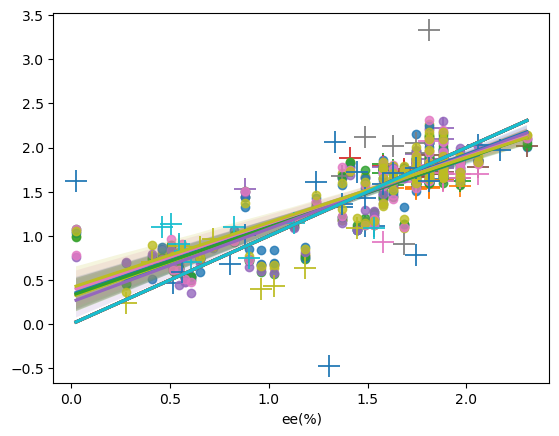

In [12]:
pair_dataloader = MVLRdataloader(pair_dataset,
                                 k_fold=10
                                 )
discriptor_list = list(pair_dataset.filtered_pair_data_df.keys())
R2_list = []
test_MAE_list = []
for i in range(len(pair_dataloader)):
    trainexpdf, trainparadf, testexpdf, testparadf = pair_dataloader[i]

    model, R2, train_RMSE, train_MAE = OLS_fitter_plotter(trainexpdf, trainparadf, discriptor_list)
    R2_list.append(R2)
    if max(R2_list) == R2:
        best_model = model

    test_RMSE, test_MAE, predvalue = OLS_tester(model, testexpdf, testparadf, discriptor_list)
    print(predvalue)
    test_MAE_list.append(test_MAE)

print('R2:', R2_list)
print('10-fold R2 =', sum(R2_list)/len(R2_list))
print('MAE:', test_MAE_list)
print('10-fold MAE =', sum(test_MAE_list)/len(test_MAE_list))

OOSexpdf = OOS_dataset.expdata_enantio_df
OOSparadf = OOS_dataset.filtered_pair_data_df
OOS_RMSE, OSS_MAE, OOS_predvalue = OLS_tester(best_model, OOSexpdf, OOSparadf, discriptor_list)

## Pearson correlation filter

In [9]:
def GetPvalue_Pearson(x,y):
    return float(pearsonr(x,y)[1])

df = pair_dataset.filtered_pair_data_df.corr(method=GetPvalue_Pearson)
df.columns = ['ΔE$_{sp}$', 'ΔF$_{RMS}$', 'ΔF$_{Max}$', 'ΔE$_{LUMO}$', 'ΔE$_{Gap}$', 'ΔQ$_{1}$',
            'ΔQ$_{2}$', 'ΔQ$_{4}$', 'ΔQ$_{8}$', 'ΔQ$_{9}$', 'ΔQ$_{11}$', 'ΔQ$_{12}$', 'ΔQ$_{13}$']
df.index = ['ΔE$_{sp}$', 'ΔF$_{RMS}$', 'ΔF$_{Max}$', 'ΔE$_{LUMO}$', 'ΔE$_{Gap}$', 'ΔQ$_{1}$',
            'ΔQ$_{2}$', 'ΔQ$_{4}$', 'ΔQ$_{8}$', 'ΔQ$_{9}$', 'ΔQ$_{11}$', 'ΔQ$_{12}$', 'ΔQ$_{13}$']

heatmap

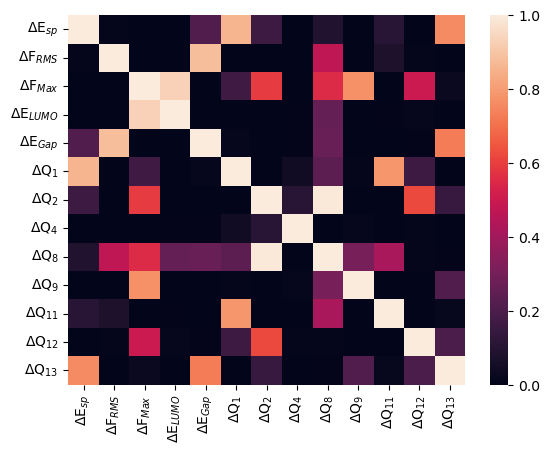

In [10]:
p1 = sns.heatmap(df)

In [11]:
file_path = 'pics/pearsoncorr.png'
figure1 = p1.get_figure()
figure1.savefig(file_path, dpi=1000, bbox_inches='tight')

## 10-fold cross validation
split data according to 10-fold cross validation

In [14]:
pair_dataloader = MVLRdataloader(pair_dataset,
                                 k_fold=10
                                 )

input dataset has 90 items


conduct 10-fold cross validation

In [67]:
def screen_discriptors(pair_dataloader, OOS_dataset, discriptor_list):
    R2_list = []
    test_MAE_list = []
    for i in range(len(pair_dataloader)):
        trainexpdf, trainparadf, testexpdf, testparadf = pair_dataloader[i]

        model, R2, _, _, _, _ = OLS_fitter_plotter(trainexpdf, trainparadf, discriptor_list)
        R2_list.append(R2)
        if max(R2_list) == R2:
            best_model = model

        test_RMSE, test_MAE, testpredvalue = OLS_tester(model, testexpdf, testparadf, discriptor_list)
        # print(predvalue)
        test_MAE_list.append(test_MAE)

    averageR2 = sum(R2_list)/len(R2_list)
    averageMAE = sum(test_MAE_list)/len(test_MAE_list)

    # plot best model
    best_R2 = max(R2_list)
    best_index = R2_list.index(best_R2)
    trainexpdf, trainparadf, testexpdf, testparadf = pair_dataloader[best_index]
    _, _, _, _, y, pred_y = OLS_fitter_plotter(trainexpdf, trainparadf, discriptor_list, plot=True)

    OOSexpdf = OOS_dataset.expdata_enantio_df
    OOSparadf = OOS_dataset.filtered_pair_data_df
    OOS_RMSE, OOS_MAE, OOS_predvalue = OLS_tester(best_model, OOSexpdf, OOSparadf, discriptor_list, plot=True)

    p1 = sns.regplot(x=y,y=pred_y, label='training dataset')
    sns.regplot(x=y,y=y, marker='',line_kws={'linestyle':'--'})
    sns.regplot(x=OOSexpdf, y=OOS_predvalue, fit_reg=False, color='orange', label='OOS dataset')
    p1.set_xlabel('Experimental ΔΔG (kcal/mol)')
    p1.set_ylabel('Predicted ΔΔG (kcal/mol)')
    plt.legend(loc='best')
    p1.text(1.5,0.25,'R$^{2}$=%.3f' % averageR2, horizontalalignment='left', size='medium', color='black')
    p1.text(1.5,0.125,'MAE={:.3f} kcal/mol'.format(averageMAE), horizontalalignment='left', size='medium', color='black')
    p1.text(1.5,0,'OOS MAE={:.3f} kcal/mol'.format(OOS_MAE), horizontalalignment='left', size='medium', color='black')

    fig_path = 'pics/model.png'
    figure1 = p1.get_figure()
    figure1.savefig(fig_path, dpi=1000, bbox_inches='tight')

    return averageR2, averageMAE, OOS_MAE, best_model


test dataset has 9 items 
train dataset has 81 items
RMSE= 0.18770692773134665
MAE= 0.14587189011523685
test_RMSE= 0.28899559528777324
test_MAE= 0.22431908087006874
test dataset has 9 items 
train dataset has 81 items
RMSE= 0.19346294569458955
MAE= 0.15199764620593498
test_RMSE= 0.25512130757423235
test_MAE= 0.24053245371210352
test dataset has 9 items 
train dataset has 81 items
RMSE= 0.1997517581821017
MAE= 0.15518316156070971
test_RMSE= 0.17938508198200417
test_MAE= 0.16536544832337685
test dataset has 9 items 
train dataset has 81 items
RMSE= 0.20471788171638772
MAE= 0.1611511097733942
test_RMSE= 0.11393445420917411
test_MAE= 0.0917369209088127
test dataset has 9 items 
train dataset has 81 items
RMSE= 0.1961059853312927
MAE= 0.15158002632458417
test_RMSE= 0.2103517424669537
test_MAE= 0.168223709518806
test dataset has 9 items 
train dataset has 81 items
RMSE= 0.1935873927036043
MAE= 0.1494154248564748
test_RMSE= 0.23094180077464116
test_MAE= 0.19118665134258644
test dataset has 9 

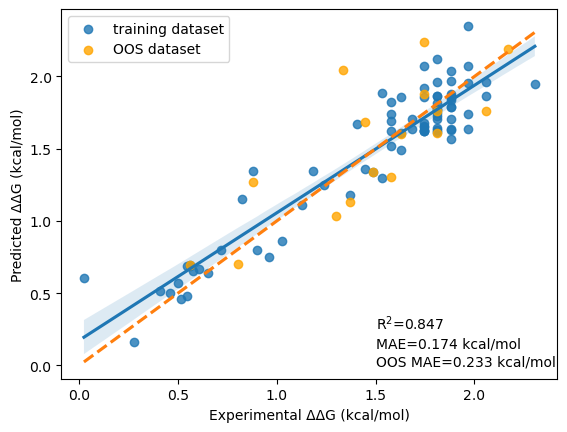

In [76]:
discriptor_list = ['xtb-mod-gau-sp_SPE_diff',
                   #'xtb-mod-gau-sp_ForceRMS_diff',
                   'xtb-mod-gau-sp_ForceMax_diff',
                   #'xtb-mod-gau-sp_ELUMO_diff',  # 5
                   #'xtb-mod-gau-sp_Gap_diff',  # 3
                   #'xtb-mod-gau-sp_charge-1_diff',  # 1
                   'xtb-mod-gau-sp_charge-2_diff',
                   'xtb-mod-gau-sp_charge-4_diff',  # 2
                   #'xtb-mod-gau-sp_charge-8_diff',
                   #'xtb-mod-gau-sp_charge-9_diff',  # 4
                   'xtb-mod-gau-sp_charge-11_diff',  # 0
                   'xtb-mod-gau-sp_charge-12_diff',
                   #'xtb-mod-gau-sp_charge-13_diff',
                   ]

R2, MAE, OOSMAE, bm = screen_discriptors(pair_dataloader, OOS_dataset, discriptor_list)

print(bm.summary())
print(bm.params)


In [ ]:
full_discriptor_list = ['xtb-mod-gau-sp_SPE_diff',
                   'xtb-mod-gau-sp_ForceRMS_diff',
                   'xtb-mod-gau-sp_ForceMax_diff',
                   'xtb-mod-gau-sp_ELUMO_diff',  # 5
                   'xtb-mod-gau-sp_Gap_diff',  # 3
                   'xtb-mod-gau-sp_charge-1_diff',  # 1
                   'xtb-mod-gau-sp_charge-2_diff',
                   'xtb-mod-gau-sp_charge-4_diff',  # 2
                   'xtb-mod-gau-sp_charge-8_diff',
                   'xtb-mod-gau-sp_charge-9_diff',  # 4
                   'xtb-mod-gau-sp_charge-11_diff',  # 0
                   'xtb-mod-gau-sp_charge-12_diff',
                   'xtb-mod-gau-sp_charge-13_diff',
                   ]

discriptor_combinations = []
for j in range(1, len(full_discriptor_list)+1):
    discriptor_combinations += list(combinations(full_discriptor_list,j))

resultlist = []
for comb in discriptor_combinations:
    discriptor_list = list(comb)
    single_result = list(screen_discriptors(pair_dataloader, OOS_dataset, discriptor_list)) + discriptor_list
    resultlist.append(single_result)

for i in resultlist:
    print(i)

test dataset has 9 items 
train dataset has 81 items
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.519
Model:                            OLS   Adj. R-squared:                  0.513
Method:                 Least Squares   F-statistic:                     85.35
Date:                Mon, 15 May 2023   Prob (F-statistic):           3.33e-14
Time:                        22:10:40   Log-Likelihood:                -23.646
No. Observations:                  81   AIC:                             51.29
Df Residuals:                      79   BIC:                             56.08
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------

KeyboardInterrupt: 

In [ ]:

model, R2, RMSE, MAE = OLS_fitter_plotter(expdf, paradf, best_discriptor)
pred_y = model.fittedvalues
for i, y in enumerate(expdf):
    print(y, pred_y[i])
print('******test******')
for structure in test_name_list:
    print(structure)
test_RMSE, test_MAE = OLS_tester(model, testexpdf, testparadf, best_discriptor)


In [48]:
def random_10_fold_test(pair_dataset):
    all_name_list = pair_dataset.structure_name_list

    test_name_list = [all_name_list[i] for i in random.sample(range(len(pair_dataset)), len(pair_dataset)//10)]  # set 10% cases as test

    testexpdf = pair_dataset.expdata_enantio_df[test_name_list]
    expdf = pair_dataset.expdata_enantio_df.drop(test_name_list)

    testparadf = pair_dataset.filtered_pair_data_df.loc[test_name_list]
    paradf = pair_dataset.filtered_pair_data_df.drop(test_name_list)

    best_R2, best_discriptor, result_list = OLS_R2_screener(expdf, paradf)

    model, R2, RMSE, MAE = OLS_fitter_plotter(expdf, paradf, best_discriptor)

    test_RMSE, test_MAE = OLS_tester(model, testexpdf, testparadf, best_discriptor)

    return R2, MAE, test_MAE

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.897
Model:                            OLS   Adj. R-squared:                  0.872
Method:                 Least Squares   F-statistic:                     36.26
Date:                Wed, 26 Apr 2023   Prob (F-statistic):           1.80e-20
Time:                        23:43:24   Log-Likelihood:                 18.585
No. Observations:                  63   AIC:                            -11.17
Df Residuals:                      50   BIC:                             16.69
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.2174      0.283      4.296      0.0

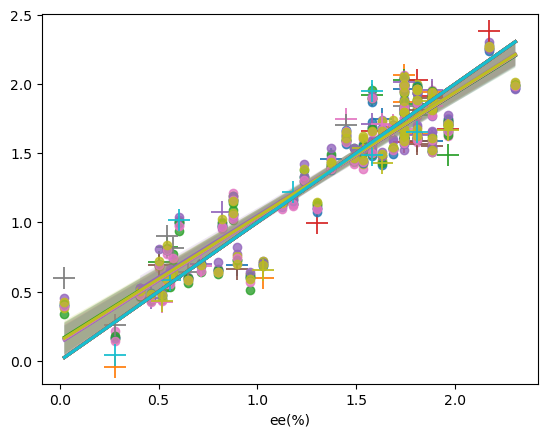

In [50]:
random_10_fold_result_list = []
for i in range(10):
    R2, MAE, test_MAE = random_10_fold_test(pair_dataset)
    resultline = 'test {}: R2= {} train_MAE= {} test_MAE= {}\n'.format(i, R2, MAE, test_MAE)
    random_10_fold_result_list.append(resultline)

In [51]:
with open('random_10_fold_result.log', 'w') as w:
    w.writelines(random_10_fold_result_list)